In [1]:
import numpy as np
import matplotlib.pyplot as plot
import cv2

In [40]:
source1 = cv2.imread('bridge.JPG', cv2.IMREAD_COLOR)
source2 = cv2.imread('road.JPG', cv2.IMREAD_COLOR)

In [13]:
a=0.3
b=0.7

img_blended = cv2.addWeighted(source1, a, source2, b, 0.0)

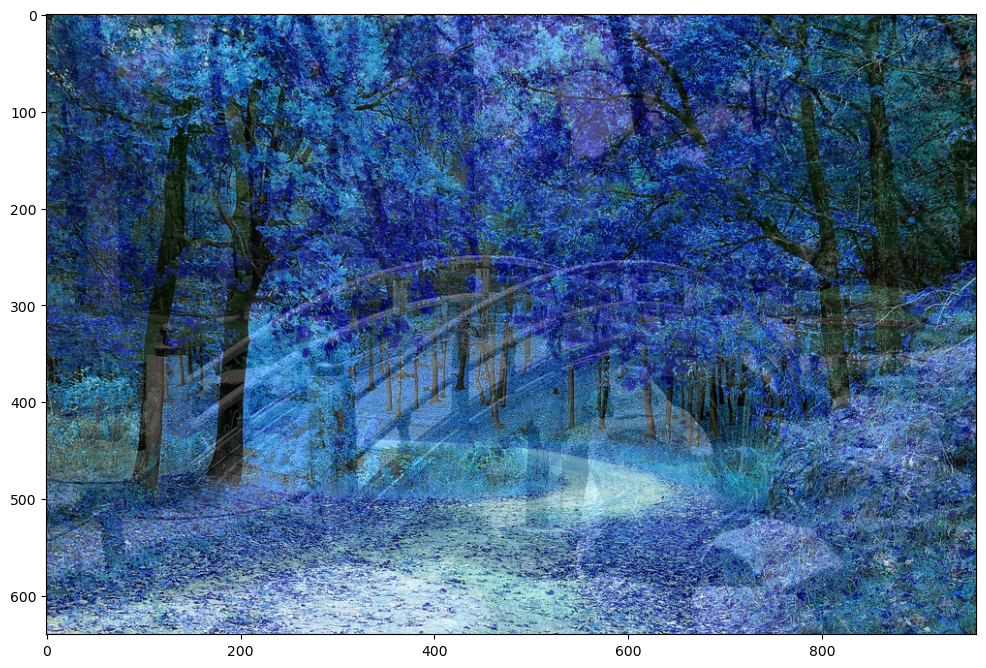

In [14]:
plot.figure(figsize=(12,12))
plot.imshow(img_blended)

Selecciona una de las imágenes anteriores y modifica su contraste y brillo utilizando NumPy e imprime el resultado final.

In [17]:
source1gray=cv2.imread('bridge.JPG', cv2.IMREAD_GRAYSCALE)

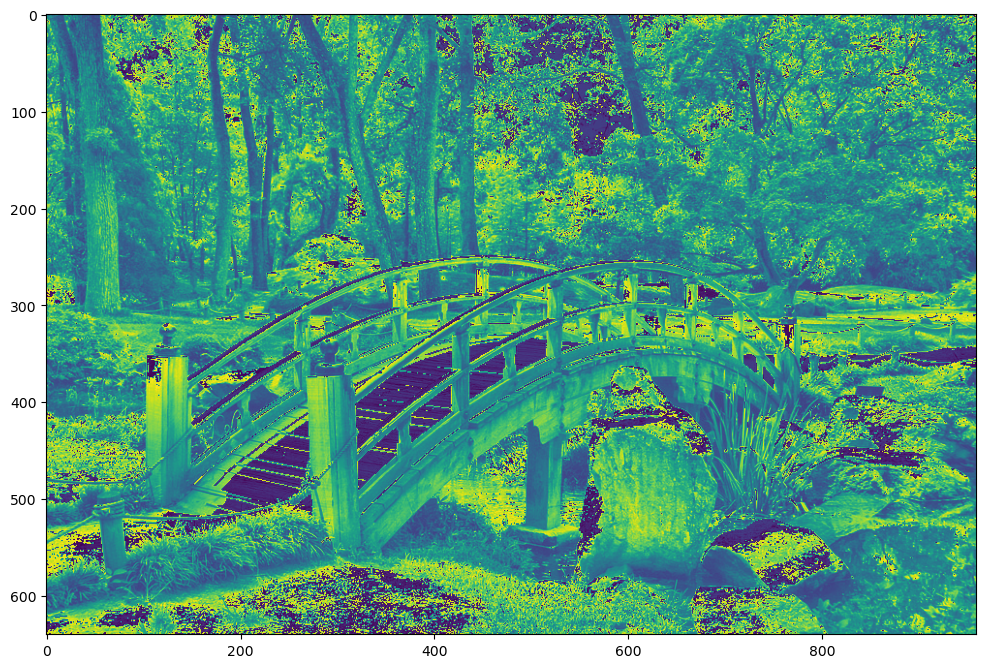

In [23]:
# para incrementar el brillo de una imagen, se suma un valor constante a cada pixel
import imageio
bright_image = source1gray + 50
bright_image[bright_image > 255] = 255
plot.figure(figsize=(12,12))
plot.imshow(bright_image)
#imageio.imwrite("bright_grey_bridge.jpg", bright_image.astype(np.uint8))

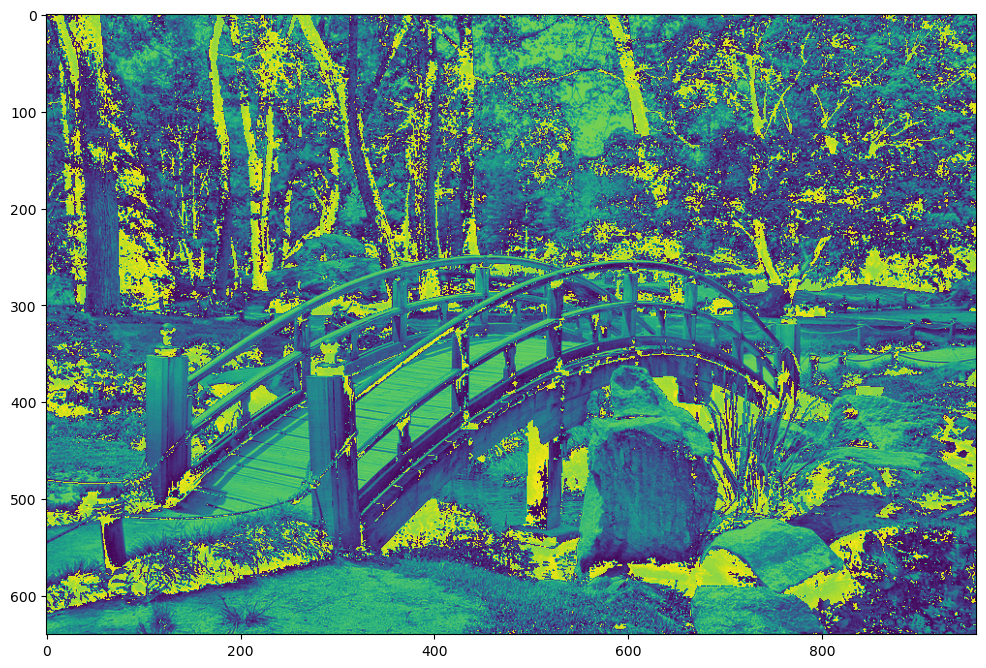

In [27]:
# para disminuir el brillo de una imagen, se resta un valor constante a cada pixel

dark_image = source1gray - 50
dark_image[dark_image < 0] = 0
plot.figure(figsize=(12,12))
plot.imshow(dark_image)

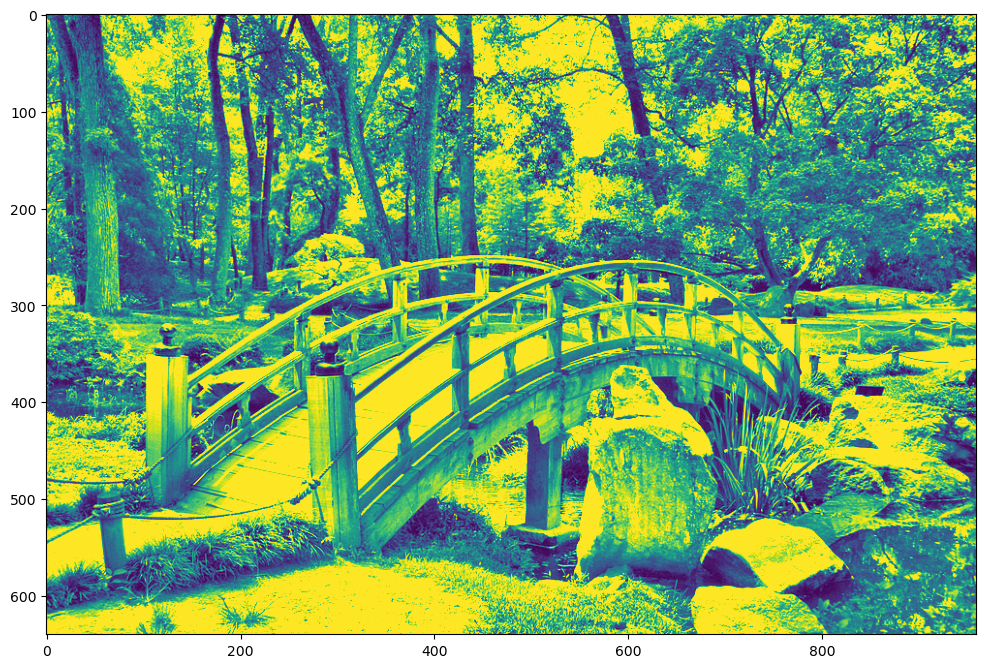

In [24]:
# para ajustar el contraste de una imagen, se multiplica un valor constante a cada pixel
high_contrast_image = source1gray * 1.5
high_contrast_image[high_contrast_image > 255] = 255
plot.figure(figsize=(12,12))
plot.imshow(high_contrast_image)
#imageio.imwrite("high_contrast_grey_tree.jpg", high_contrast_image.astype(np.uint8))


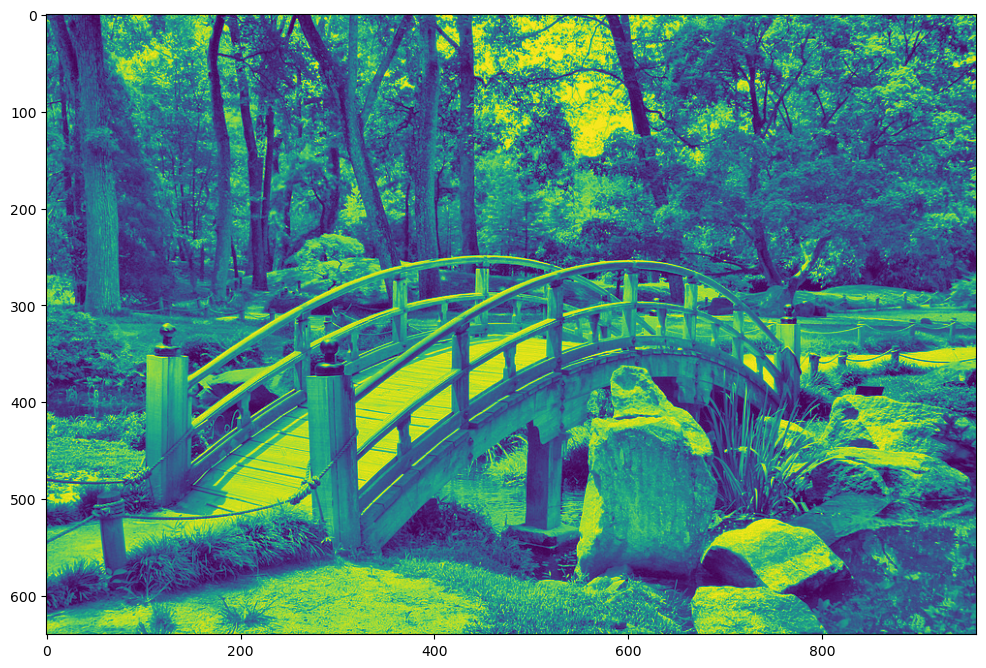

In [26]:
low_contrast_image = source1gray * 0.5
low_contrast_image[low_contrast_image > 255] = 255
#imageio.imwrite("high_contrast_grey_tree.jpg", low_contrast_image.astype(np.uint8)
plot.figure(figsize=(12,12))
plot.imshow(low_contrast_image)

Selecciona una de las imágenes del punto 1 y suavízala aplicando filtros medio, Gaussiano y bilateral, e imprime el resultado final.

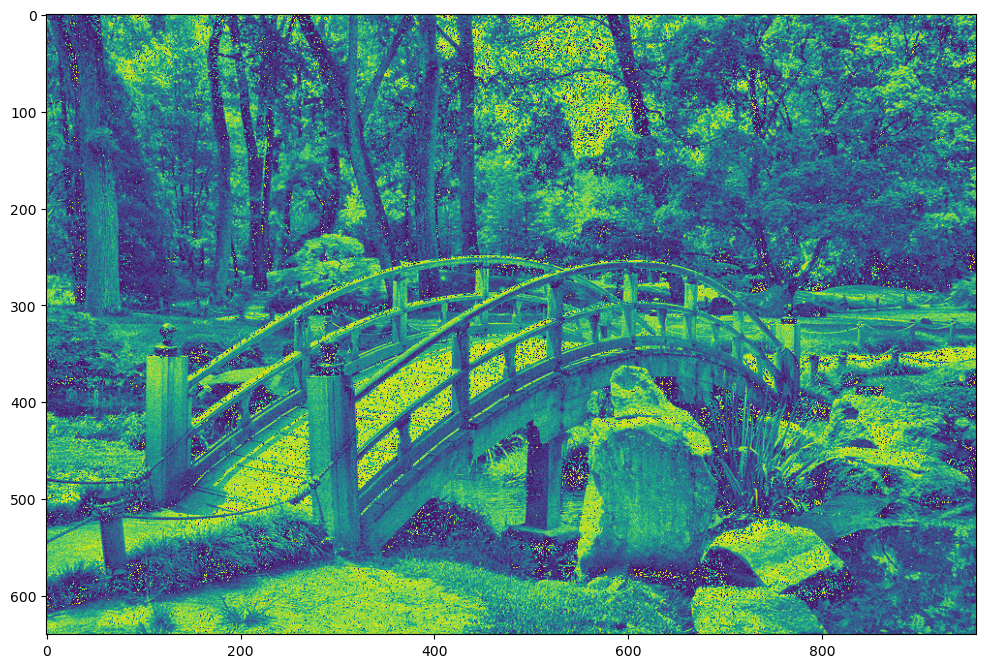

In [32]:
#imagen con ruido
rows, cols,  = source1gray.shape
media = 0
desviacionestandar = 15
#0.1**0.5 #desviacion estandar es el parametro, 
#varianza es la desviacion estandar al cuadrado
n = 3
#ruido = np.random.normal(media,desviacionestandar, (rows, cols, n)).astype(np.uint8)
ruido = np.random.normal(media,desviacionestandar, (rows, cols)).astype(np.uint8)
#random.normal(loc=0.0, scale=1.0, size=None)
#size = int or tuple of ints, optional
#Output shape. If the given shape is, e.g., (m, n, k), then m * n * k samples are drawn.
# If size is None (default), a single value is returned if loc and scale are both scalars. 
#Otherwise, np.broadcast(loc, scale).size samples are drawn.
img01_ruido = source1gray + ruido

plot.figure(figsize=(12,12))
plot.imshow(img01_ruido)

#plot.subplot(121),plot.imshow(img01),plot.title('Original')
#plot.xticks([]), plot.yticks([])
#plot.subplot(122),plot.imshow(img01_ruido),plot.title('Noisy')
#plot.xticks([]), plot.yticks([])
#plot.show()

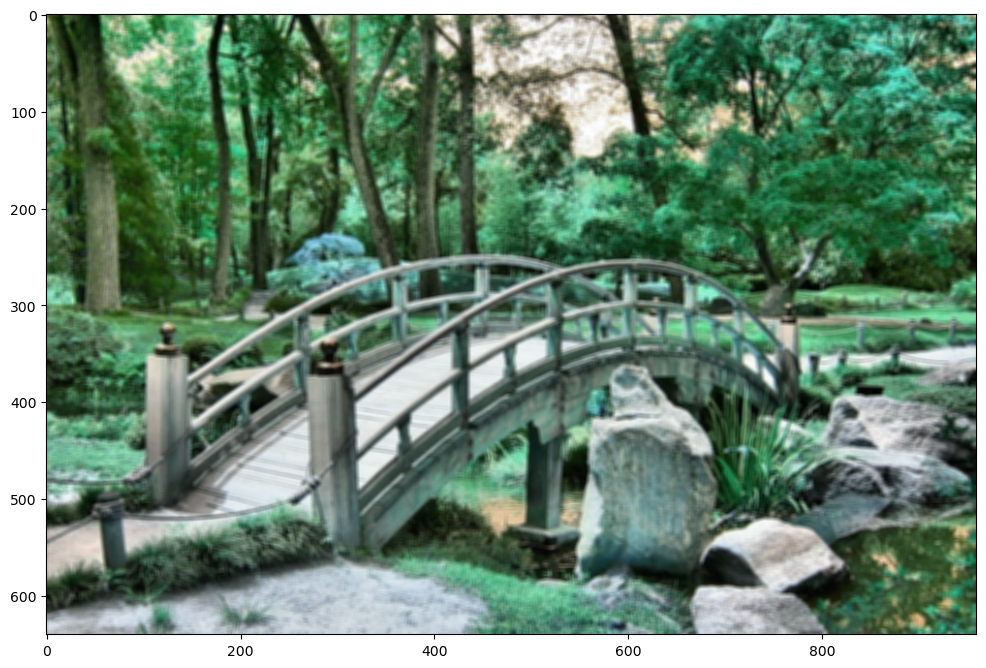

In [41]:
#filtro medio
blur = cv2.blur(source1,(5,5))
plot.figure(figsize=(12,12))
plot.imshow(blur)

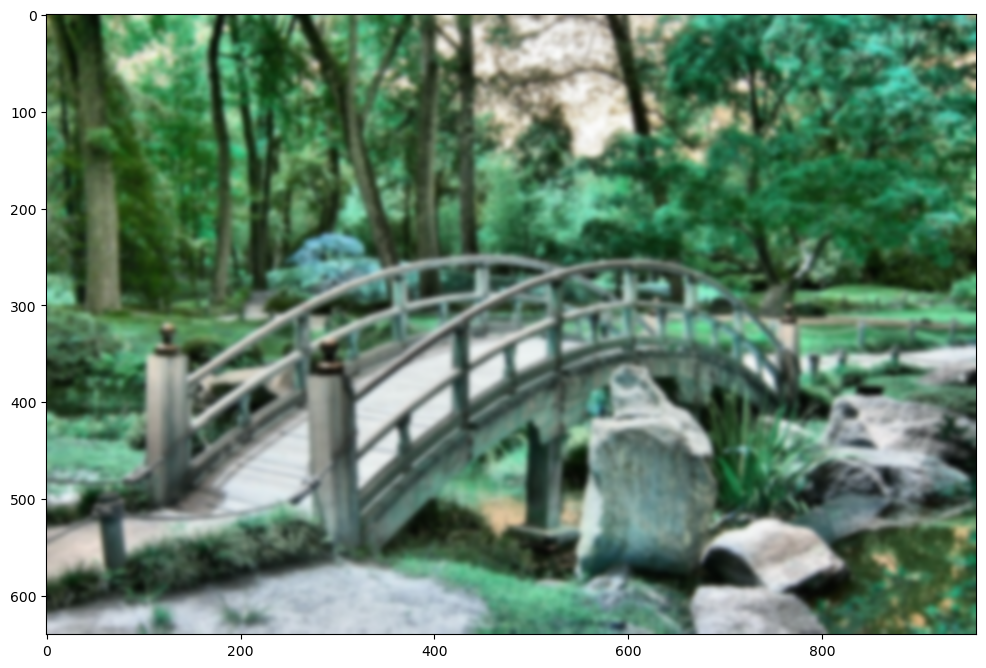

In [43]:
#filtro gaussiano
gauss = cv2.GaussianBlur(source1,(15,15),0)
plot.figure(figsize=(12,12))
plot.imshow(gauss)

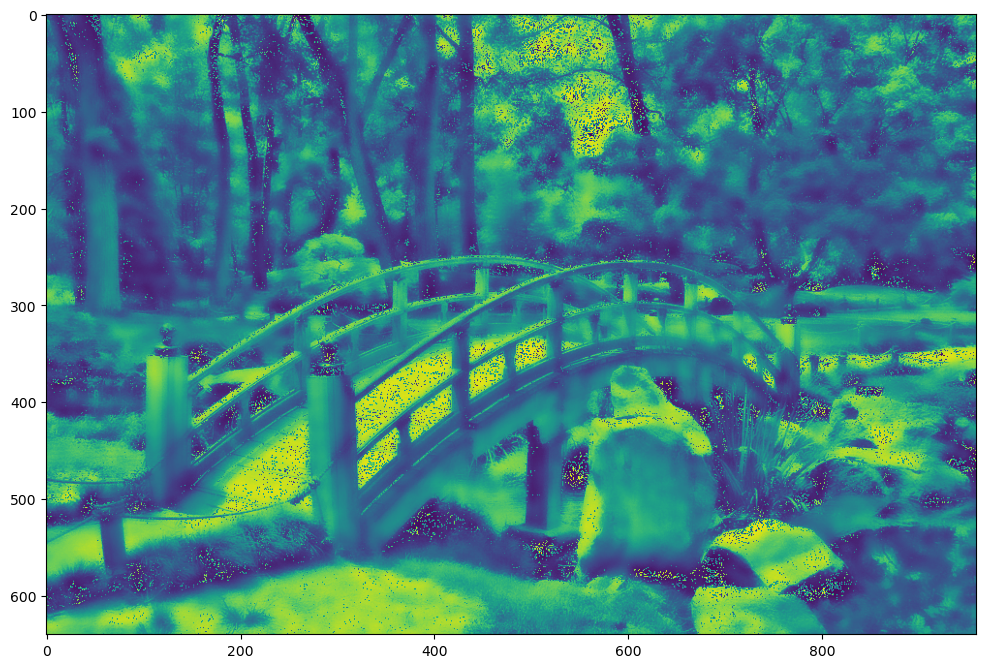

In [34]:
img_bilateral = cv2.bilateralFilter(img01_ruido, 15, 75, 75)
plot.figure(figsize=(12,12))
plot.imshow(img_bilateral)

Selecciona una de las imágenes del punto 1 y modifícala usando erosión y dilatación. Utiliza tres tipos diferentes de kernel: MORPH_RECT, MORPH_CROSS y MORPH_ELLIPS.

In [ ]:
from __future__ import print_function
import cv2 as cv
import numpy as np
import argparse
src = None
erosion_size = 0
max_elem = 2
max_kernel_size = 21
title_trackbar_element_shape = 'Elemento:\n 0: Rect \n 1: Cross \n 2: Ellipse'
title_trackbar_kernel_size = 'Tamaño de Kernel:\n 2n +1'
title_erosion_window = 'Erosion'
title_dilation_window = 'Dilatación'
def main(image):
    #image = 'bridge.JPG'
    global src
    #src = cv.imread(cv.samples.findFile(image))
    src = cv.imread(image)
    if src is None:
        print('Could not open or find the image: ', image)
        exit(0)
    cv.namedWindow(title_erosion_window)
    cv.createTrackbar(title_trackbar_element_shape, title_erosion_window, 0, max_elem, erosion)
    cv.createTrackbar(title_trackbar_kernel_size, title_erosion_window, 0, max_kernel_size, erosion)
    cv.namedWindow(title_dilation_window)
    cv.createTrackbar(title_trackbar_element_shape, title_dilation_window, 0, max_elem, dilatation)
    cv.createTrackbar(title_trackbar_kernel_size, title_dilation_window, 0, max_kernel_size, dilatation)
    erosion(0)
    dilatation(0)
    cv.waitKey()
# optional mapping of values with morphological shapes
def morph_shape(val):
    if val == 0:
        return cv.MORPH_RECT
    elif val == 1:
        return cv.MORPH_CROSS
    elif val == 2:
        return cv.MORPH_ELLIPSE
def erosion(val):
    erosion_size = cv.getTrackbarPos(title_trackbar_kernel_size, title_erosion_window)
    erosion_shape = morph_shape(cv.getTrackbarPos(title_trackbar_element_shape, title_erosion_window))
    
    element = cv.getStructuringElement(erosion_shape, (2 * erosion_size + 1, 2 * erosion_size + 1),(erosion_size, erosion_size))
    
    erosion_dst = cv.erode(src, element)
    cv.imshow(title_erosion_window, erosion_dst)
def dilatation(val):
    dilatation_size = cv.getTrackbarPos(title_trackbar_kernel_size, title_dilation_window)
    dilation_shape = morph_shape(cv.getTrackbarPos(title_trackbar_element_shape, title_dilation_window))
    element = cv.getStructuringElement(dilation_shape, (2 * dilatation_size + 1, 2 * dilatation_size + 1),\
                                       (dilatation_size, dilatation_size))
    dilatation_dst = cv.dilate(src, element)
    cv.imshow(title_dilation_window, dilatation_dst)
if __name__ == "__main__":
    #parser = argparse.ArgumentParser(description='Code for Eroding and Dilating tutorial.')
    #parser.add_argument('--input', help='Path to input image.', default='bridge.jpg')
    #args = parser.parse_args()
    #main(args.input)
    main('bridge.jpg')